In [1]:
import os
import sys
sys.path.insert(1,'./src')
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('bmh')
from datetime import datetime

from read_funcs import read_prs_l2d
from proc_funcs import find_nearest, idx_mesh, make_rgb, make_rgb_dc,reflectance_norm,AOI,get_coord_id,append_new_line
from img_list import use_cases

In [3]:
# Set to True to show plots, save them, and/or save processed files
make_plots = True
save_plots = False
save_files = False

In [6]:
path_l2d = '../DATABASE/'
use_case='Po_01'
name_case_study=use_case
name_img_1=use_cases[use_case][0][0][0]
name_img_2=use_cases[use_case][0][1][0]
tstart1=use_cases[use_case][0][0][1]
tend1=use_cases[use_case][0][0][2]
tstart2=use_cases[use_case][0][1][1]
tend2=use_cases[use_case][0][1][2]
band=use_cases[use_case][2]
iteration=use_cases[use_case][5][0]
radius=use_cases[use_case][5][1]
radius_1=radius[0]
radius_2=radius[1]
rank=use_cases[use_case][5][2]
pyramid=use_cases[use_case][5][3]
coregAOI=use_cases[use_case][1]

In [7]:
y1, x1, vwl1, swl1, vrf1, srf1, info1 = read_prs_l2d(path_l2d, tstart1, tend1)
y2, x2, vwl2, swl2, vrf2, srf2, info2 = read_prs_l2d(path_l2d, tstart2, tend2)

In [8]:
if save_files is True:
    np.save(path_l2d+'swl_'+name_case_study, swl1)
    np.save(path_l2d+'vwl_'+name_case_study, vwl1)

In [9]:
img1_v = vrf1
img2_v = vrf2

img1_r = srf1
img2_r = srf2

In [10]:
#extracting the index in the vwl1 vector corresponding to R,G,B bands
R_idx=find_nearest(vwl1,640)
G_idx=find_nearest(vwl1,560)
B_idx=find_nearest(vwl1,480)

In [11]:
t1_v,t2_v=reflectance_norm(path_l2d,img1_v,img2_v,tstart1,tstart2,tend1,tend2)

In [12]:
t1_r,t2_r=reflectance_norm(path_l2d,img1_r,img2_r,tstart1,tstart2,tend1,tend2)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


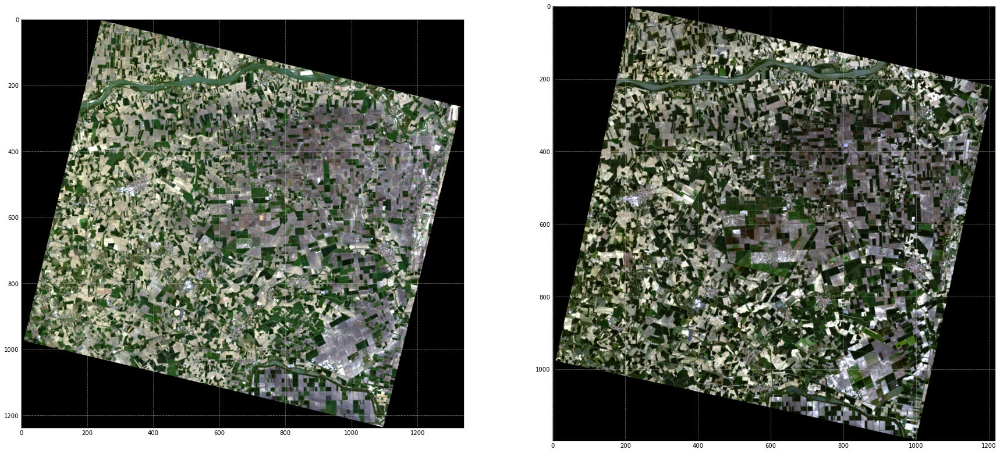

In [13]:
rgb1_bef = make_rgb_dc(t1_v,vwl1)
rgb2_bef = make_rgb_dc(t2_v,vwl1)
if make_plots is True:
    plt.figure(figsize=(30,15))

    plt.subplot(1,2,1)
    plt.imshow(rgb1_bef)
    plt.subplot(1,2,2)
    """
    #uncomment if histogram stretch is needed (enhance image contrast accorsingly to the histogram of the reflectance values)
    threshold=0.2
    rgb2[rgb2>threshold]=threshold
    rgb2=rgb2/threshold
    """
    plt.imshow(rgb2_bef)

In [15]:
# North-western corner (in L2D coordinates)
if x1[0,0] >= x2[0,0]: # x holds the longitudes
    xnw = x1[0,0]
else:
    xnw = x2[0,0]

if y1[0,0] <= y2[0,0]: # y holds the latitudes
    ynw = y1[0,0]
else:
    ynw = y2[0,0]

# South-eastern corner
if x1[-1,-1] <= x2[-1,-1]:
    xse = x1[-1,-1]
else:
    xse = x2[-1,-1]

if y1[-1,-1] >= y2[-1,-1]:
    yse = y1[-1,-1]
else:
    yse = y2[-1,-1]

In [16]:
tol = 30 # m  
i1nw, j1nw = idx_mesh(xnw, ynw, x1, y1, maxdist=tol)
i2nw, j2nw = idx_mesh(xnw, ynw, x2, y2, maxdist=tol)
i1se, j1se = idx_mesh(xse, yse, x1, y1, maxdist=tol)
i2se, j2se = idx_mesh(xse, yse, x2, y2, maxdist=tol)

if i1nw > i1se or j1nw > j1se: 
    raise ValueError('Unexpected coordinate order')

if i2nw > i2se or j2nw > j2se: 
    raise ValueError('Unexpected coordinate order')

Tolerance 30 m exceeded!


## Creation and filling of the cropped datacubes

In [17]:
intx = x1[i1nw:i1se+1, j1nw:j1se+1] #longitude
inty = y1[i1nw:i1se+1, j1nw:j1se+1] #latitude

In [18]:
#initializing 4 new datacubes cropped 
#2 vrf datacubes
iimg1_v=np.zeros([len(intx[:,1]),len(intx[1,:]),len(vwl1)])
iimg2_v=np.zeros([len(intx[:,1]),len(intx[1,:]),len(vwl1)])

#2 srf datacubes
iimg1_r=np.zeros([len(intx[:,1]),len(intx[1,:]),len(swl1)])
iimg2_r=np.zeros([len(intx[:,1]),len(intx[1,:]),len(swl1)])
print(np.shape(iimg1_v),np.shape(iimg2_v))

(1179, 1218, 63) (1179, 1218, 63)


In [15]:
#filling the new datacubes with vrf information
for ii in range(np.shape(intx)[0]-1):
    for jj in range(np.shape(intx)[1]-1):
        iimg1_v[ii, jj, :] = t1_v[i1nw+ii, j1nw+jj, :]
        iimg2_v[ii, jj, :] = t2_v[i2nw+ii, j2nw+jj, :]
print(np.shape(iimg1_v),np.shape(iimg2_v))

(1184, 1161, 63) (1184, 1161, 63)


In [19]:
#filling the new datacubes srf information
for ii in range(np.shape(intx)[0]-1):
    for jj in range(np.shape(intx)[1]-1):
        iimg1_r[ii, jj, :] = t1_r[i1nw+ii, j1nw+jj, :]
        iimg2_r[ii, jj, :] = t2_r[i2nw+ii, j2nw+jj, :]

In [20]:
iimg1=np.dstack((iimg1_v,iimg1_r))
iimg2=np.dstack((iimg2_v,iimg2_r))
print(np.shape(iimg1),np.shape(iimg2))

(1179, 1218, 230) (1179, 1218, 230)


In [21]:
wl_total=np.append(vwl1,swl1)

In [22]:
#we crop just if the coreg coordinates are not Nones
if coregAOI != [None,None,None,None]:
    rgb1,rgb2,iimg1,iimg2,xcrop,ycrop=AOI(iimg1,iimg2,wl_total, long=intx, lat=inty, key=use_case)
else:
    print('No cropping applied to coregistration')
    xcrop=intx
    ycrop=inty

No cropping applied to coregistration


In [23]:
print(xcrop.shape)
print(ycrop.shape)
print(iimg1.shape)
print(iimg2.shape)

(1179, 1218)
(1179, 1218)
(1179, 1218, 230)
(1179, 1218, 230)


#### Extracting RGB bands from new cropped datacube +  set=0 where null values


In [24]:
#extracting RGB bands from new cropped datacube

Red1 = iimg1[:,:,R_idx]
Red2 = iimg2[:,:,R_idx]
Green1 = iimg1[:,:,G_idx]
Green2= iimg2[:,:,G_idx]
Blue1 = iimg1[:,:,B_idx]
Blue2 = iimg2[:,:,B_idx]

In [25]:
print(iimg1.shape)
print(iimg2.shape)

(1179, 1218, 230)
(1179, 1218, 230)


In [ ]:
iimg1[np.where(iimg2 == 0)] = 0. #if the other iimg is 0 it transforms the current iimg to 0 as well
iimg2[np.where(iimg1 == 0)] = 0.

#### Exporting the master datacube cropped to use it on another pipeline

In [24]:
if save_files is True:
    np.save(path_l2d+'iimg1_'+name_case_study, iimg1) 
    np.save(path_l2d+'iimg2_'+name_case_study, iimg2) 

In [25]:
if save_files is True:
    np.save(path_l2d+'wl_total_'+name_case_study, wl_total) 

In [26]:
if save_files is True:
    np.save(path_l2d+'lat_'+name_case_study, ycrop)
    np.save(path_l2d+'long_'+name_case_study, xcrop) 

In [27]:
iimg1 = np.load(path_l2d+'iimg1_'+name_case_study+'.npy')
iimg2 = np.load(path_l2d+'iimg2_'+name_case_study+'.npy')
wl_total = np.load(path_l2d+'wl_total_'+name_case_study+'.npy')
xcrop=np.load(path_l2d+'long_'+name_case_study+'.npy') 
ycrop=np.load(path_l2d+'lat_'+name_case_study+'.npy') 

In [28]:
rgb1_crop = make_rgb_dc(iimg1,wl_total)
rgb2_crop = make_rgb_dc(iimg2,wl_total)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


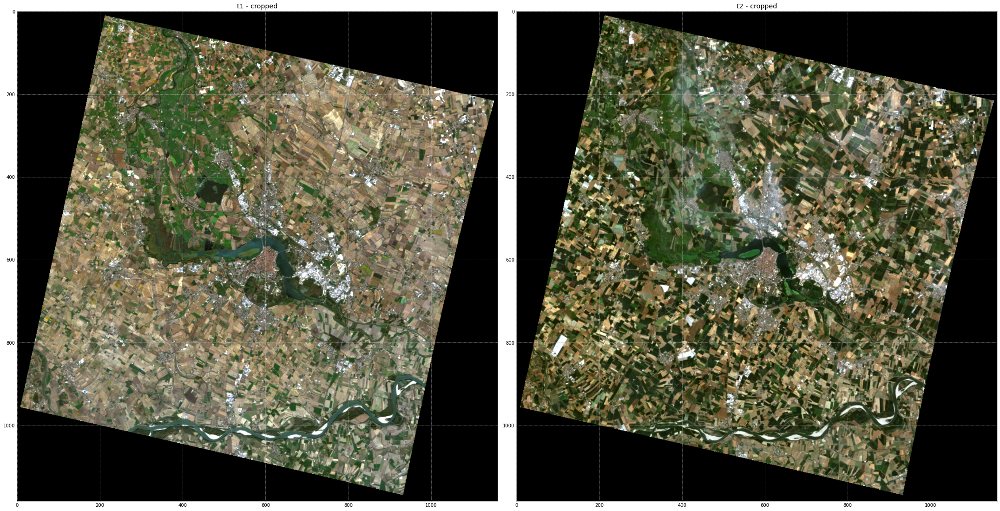

In [29]:
if make_plots is True:
    plt.figure(figsize=(30,15))

    plt.subplot(1,2,1)
    """
    #uncomment if histogram stretch is needed (enhance image contrast accordingly to the histogram of the reflectance values)
    threshold=0.2
    rgb1_crop[rgb1_crop>threshold]=threshold
    rgb1_crop=rgb1_crop/threshold
    """
    plt.imshow(rgb1_crop)
    plt.title("t1 - cropped")

    plt.subplot(1,2,2)
    """
    #uncomment if histogram stretch is needed (enhance image contrast accordingly to the histogram of the reflectance values)
    threshold=0.2
    rgb2_crop[rgb2_crop>threshold]=threshold
    rgb2_crop=rgb2_crop/threshold
    """
    plt.imshow(rgb2_crop)
    plt.title("t2 - cropped")
    plt.tight_layout()

## Computation of optical flow

In [30]:
sys.path.append('../gefolki/')
from algorithm import EFolki
from tools import wrapData

In [31]:
if band=='g':
    u, v = EFolki(Green1, Green2, iteration=iteration, radius=radius, rank=rank, levels=pyramid)
    print('coregistration executed with green band')
    if save_files is True:
        np.save(path_l2d+'u_'+name_case_study, u) 
        np.save(path_l2d+'v_'+name_case_study, v)
elif band=='r': 
    u, v = EFolki(Red1, Red2, iteration=iteration, radius=radius, rank=rank, levels=pyramid)
    print('coregistration executed with red band')
    if save_files is True:
        np.save(path_l2d+'u_'+name_case_study, u) 
        np.save(path_l2d+'v_'+name_case_study, v)
elif band=='b':
    u, v = EFolki(Blue1, Blue2, iteration=iteration, radius=radius, rank=rank, levels=pyramid)
    print('coregistration executed with blue band')
    if save_files is True:
        np.save(path_l2d+'u_'+name_case_study, u) 
        np.save(path_l2d+'v_'+name_case_study, v)
#add a new line in the coregistration report (adding coreg parameters)
file_name=path_l2d+'Coregistration_Report.txt'
time = datetime.now()
line=name_case_study+' '+name_img_1+' '+name_img_2+' '+band+' '+str(iteration)+' '+str(radius_1)+' '+str(radius_2)+' '+str(rank)+' '+str(pyramid)+' '+str(time)
append_new_line(file_name, line)

coregistration executed with green band


#### Loading optical flow matrices

In [32]:
if band=='g':
    u = np.load(path_l2d+'u_'+name_case_study+'.npy')
    v = np.load(path_l2d+'v_'+name_case_study+'.npy')
elif band=='r':
    u = np.load(path_l2d+'u_'+name_case_study+'.npy')
    v = np.load(path_l2d+'v_'+name_case_study+'.npy')
elif band=='b':
    u = np.load(path_l2d+'u_'+name_case_study+'.npy')
    v = np.load(path_l2d+'v_'+name_case_study+'.npy')

#### Norm of opt. flow analysis

/var/folders/_3/xbqrb2pn61xbq3bc9w9ss3ww0000gn/T/ipykernel_1366/1803456476.py:8: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  plt.colorbar()


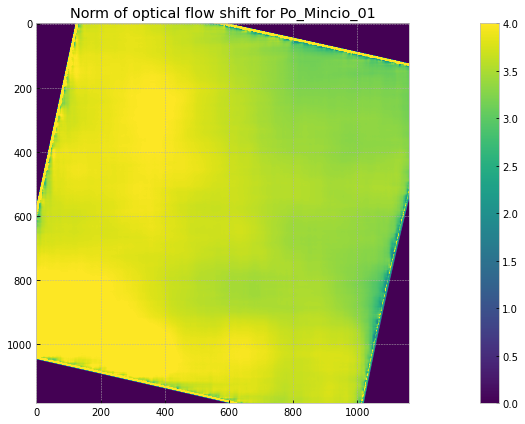

In [33]:
N = np.sqrt(u**2+v**2)

if make_plots is True:

    plt.figure(figsize=[20,6])
    plt.imshow(N,vmin=0,vmax=4)
    plt.title('Norm of optical flow shift for '+name_case_study)
    plt.colorbar()
    plt.tight_layout()

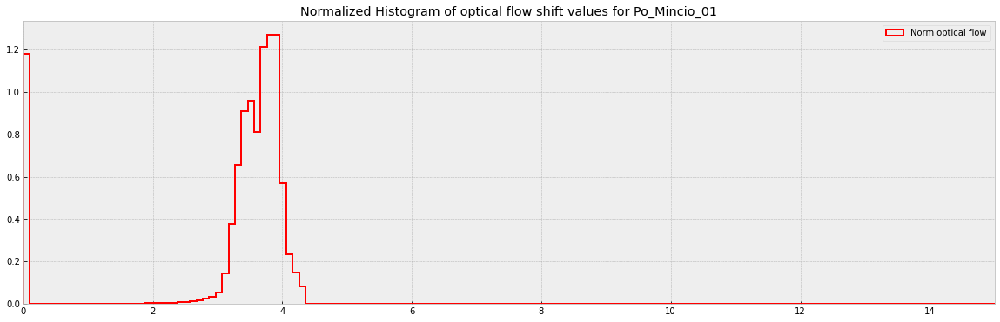

In [34]:
if make_plots is True:

    plt.figure(figsize=[20,6])

    plt.hist(N.ravel(),density='True',histtype='step', color='red', bins=256,linewidth=2, label='Norm optical flow') 
    plt.legend()

    plt.title("Normalized Histogram of optical flow shift values for "+name_case_study)
    plt.xlim(0,15)

### Datacubes of t2 coregistered

In [35]:
#initializing new datacube for coregistering the slave image
Im2recalee=np.zeros([len(iimg2[:,1]),len(iimg2[1,:]),len(wl_total)])

In [36]:
#filling the new datacube with the coregistered data (applying the the optical flow transformation to each band)
for idx,bands in enumerate (wl_total):
        Im2recalee[:,:,idx] = wrapData(iimg2[:,:,idx], u, v)

#### Saving/loading coregistered Datacubes

In [37]:
if save_files is True:
    np.save(path_l2d+'Im2recalee_'+name_case_study, Im2recalee) 

In [38]:
Im2recalee = np.load(path_l2d+'Im2recalee_'+name_case_study+'.npy')
print(np.shape(Im2recalee))

(1184, 1161, 230)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


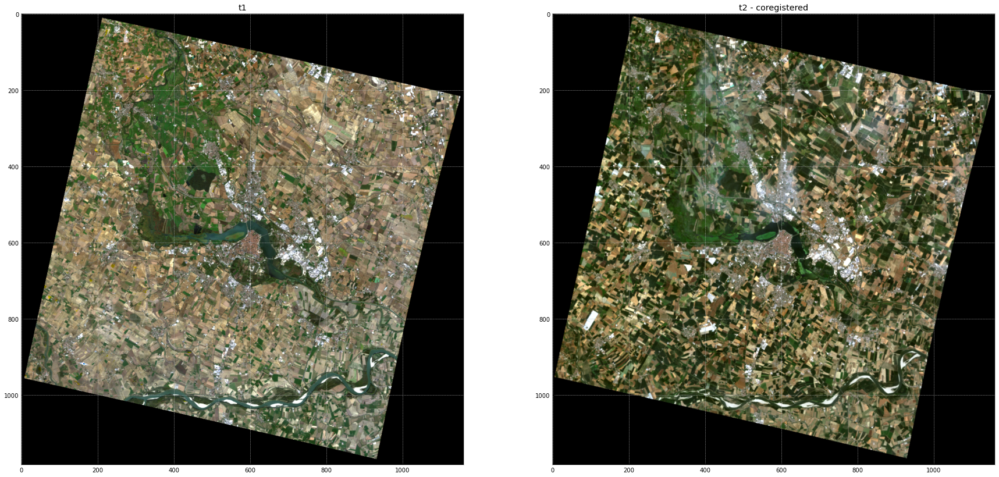

In [39]:
rgb1_aft = make_rgb_dc(iimg1,wl_total)
rgb2_aft = make_rgb_dc(Im2recalee,wl_total)

if make_plots is True:

    plt.figure(figsize=(30,15))

    plt.subplot(1,2,1)
    """
    #uncomment if histogram stretch is needed (enhance image contrast accorsingly to the histogram of the reflectance values)
    threshold=0.2
    rgb1_aft[rgb1_aft>threshold]=threshold
    rgb1_aft=rgb1_aft/threshold
    """
    plt.imshow(rgb1_aft)
    plt.title("t1")

    plt.subplot(1,2,2)
    """
    #uncomment if histogram stretch is needed (enhance image contrast accorsingly to the histogram of the reflectance values)
    threshold=0.2
    rgb2[rgb2>threshold]=threshold
    rgb2=rgb2/threshold
    """
    plt.imshow(rgb2_aft)
    plt.title("t2 - coregistered")
    if save_plots is True:
        plt.savefig(path_l2d+name_case_study+'_rgb_aftercoreg.png')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


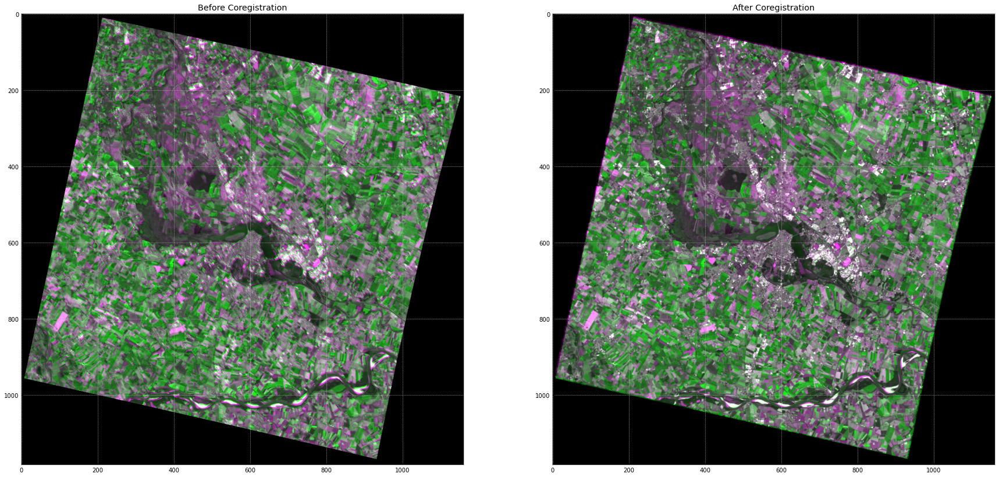

In [40]:
if make_plots is True:

    #overlay of image1 and image berfore coregistration
    """
    plt.figure(figsize=(30,15))
    rgb_weights = [0.2989, 0.5870, 0.1140]
    grey1=np.dot(rgb1,rgb_weights)
    grey2=np.dot(rgb2,rgb_weights)
    grey1[grey1>0.5]=0.5;
    grey2[grey2>0.5]=0.5
    C = np.dstack((grey2/0.5, grey1/0.5, grey2/0.5))
    plt.imshow(C)
    plt.title('Before Coregistration')
    """

    #this code has to be modified similarly to the commented part on top of this box for the INDONESIA case (it needs histogram stretching)
    plt.figure(figsize=(30,15))
    rgb_weights = [0.2989, 0.5870, 0.1140]
    grey1=np.dot(rgb1_aft,rgb_weights)
    grey2=np.dot(rgb2_crop,rgb_weights)
    C1 = np.dstack((grey2, grey1, grey2))
    plt.subplot(1,2,1)
    plt.imshow(C1)
    plt.title('Before Coregistration')

    #overlay of image1 and image after coregistration
    rgb_weights = [0.2989, 0.5870, 0.1140]
    grey1=np.dot(rgb1_aft,rgb_weights)
    grey2=np.dot(rgb2_aft,rgb_weights)
    C2 = np.dstack((grey2, grey1, grey2))
    plt.subplot(1,2,2)
    plt.imshow(C2)
    plt.title('After Coregistration')
    if save_plots is True:
        plt.savefig(path_l2d+name_case_study+'_overlay.png')